# Banking case study
Business Understanding

Financial markets are fundamental institutions in any developing economy. They play a crucial role in promoting economic growth by facilitating the channeling of saving decisions into productive investment. A major concern for financial institutions is credit risk, because if not managed properly, it can lead to a banking collapse. 

In our banking system, banks have many products to sell but the main source of income of any bank is on its credit line. Loan is the core business part of banks. A bank's profit or a loss depends to a large extent on loans i.e. whether the customers are paying back the loan or defaulting. 

Though a lot of people are applying for loans. However, they may have some difficulty in repaying the loan, due to their own capability to repay loan, their personal monetary terms, etc.. It’s hard to select the genuine applicant, who will repay the loan. While doing the process manually, a lot of misconception may happen to select the genuine applicant. The banks hold the risk of losing the amount loaned to the borrowers, which is basically regarded as "Credit risk". 

Credit risk is the potential that a bank’s borrower or counterparty fails to meet its obligations in repaying the loan borrowed from the financial institutions ("banks").

By predicting the loan defaulters, the bank can reduce its Non-Performing Assets. This makes the study of this phenomenon very important. 

Thus, the banks need to manage the credit risks in their portfolio both at the individual borrower and transactional level, as well as to consider the linkage between credit risks and other types of risk. This is because these are criteria to assess the success/failure of any banking lending activities.

Many research confirmed that machine learning technology is highly efficient to predict this situation. This technique is applied through learning from previous data.



SPRINT 1 - Data Preparation and Model Building

Problem Statement - Given various features about a customer like Age, Income, Loan Amount, Loan Intent, Home Ownership etc.. , predict if in case the loan is given, will the customer default or not on the Loan payments.

Task - Prepare the data and build a model to predict if a customer is going to default or not.

Step - 1: Load the data
Step - 2: Document the below mentioned points properly: 
- Identify the input and output/target variables. 
- Identify the type of ML Task.
- Identify the Evaluation Metric.
	- For regression task - Mean Absolute Error
	- For classification task - Accuracy
Step - 3: Split the dataset into Training and Testing (recommended 75:25 split).
Step - 4: Data preparation on train data:
- For Numerical Variables - Standardization or Normalization (Fit and Transform)
- For Categorical - LabelEncoding or OneHotEncoding (Choose wisely)
Step - 5: Data preparation on test data:
- For Numerical Variables - Standardization (Transform)
- For Categorical - LabelEncoding or OneHotEncoding (Choose wisely)
Step - 6: Model Training Phase - Use all the algorithms mentioned below to train separate models:
- KNN
- Logistic Regression
- Support Vector Machines
- Decision Trees
- Random Forest
Step - 7: Predict and evaluate each model separately using the correct evaluation metric. Use metrics.accuracy_score(actual, predict).
Step - 8: Display a plot which shows all the algorithms applied along with the accuracies achieved. Write your conclusion on the best algorithm for Credit Risk Scoring.

SPRINT 2 - Exploratory Data Analysis

Problem Statement - Given various features about a customer like Age, Income, Loan Amount, Loan Intent, Home Ownership etc.. , predict if in case the loan is given, will the customer default or not on the Loan payments.

Task - This is an open ended question. Kindly apply all your knowledge to perform an exploratory data analysis on the given dataset. It is known that the target variable is Loan Status.

Write proper conclusions and provide recommendations to the bank based on the insights.

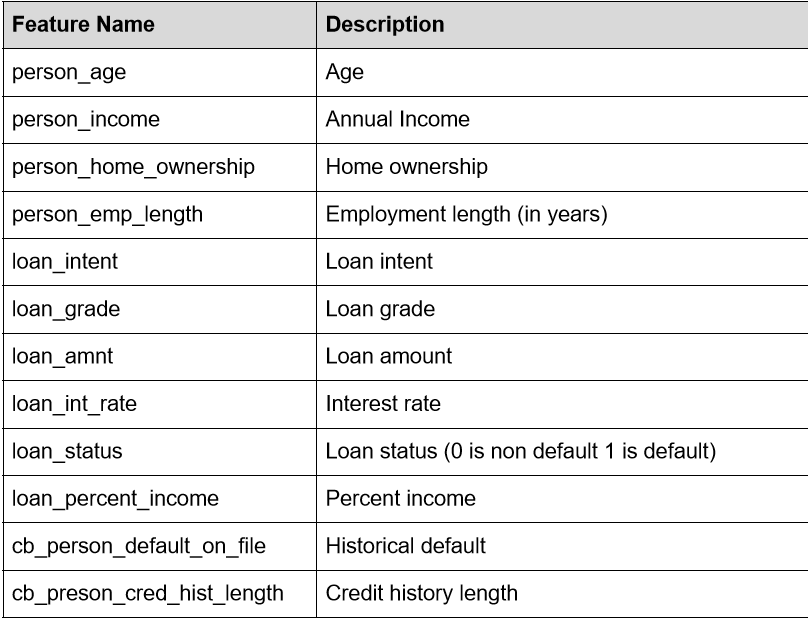

In [21]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
from ipywidgets import interact
from ipywidgets import interact_manual
import matplotlib.pyplot as plt

In [2]:
df=pd.read_csv('credit_risk_dataset.csv')
df

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
...,...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,1,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0,0.10,N,26


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  32581 non-null  int64  
 1   person_income               32581 non-null  int64  
 2   person_home_ownership       32581 non-null  object 
 3   person_emp_length           31686 non-null  float64
 4   loan_intent                 32581 non-null  object 
 5   loan_grade                  32581 non-null  object 
 6   loan_amnt                   32581 non-null  int64  
 7   loan_int_rate               29465 non-null  float64
 8   loan_status                 32581 non-null  int64  
 9   loan_percent_income         32581 non-null  float64
 10  cb_person_default_on_file   32581 non-null  object 
 11  cb_person_cred_hist_length  32581 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 3.0+ MB


In [4]:
df.isna().sum()

person_age                       0
person_income                    0
person_home_ownership            0
person_emp_length              895
loan_intent                      0
loan_grade                       0
loan_amnt                        0
loan_int_rate                 3116
loan_status                      0
loan_percent_income              0
cb_person_default_on_file        0
cb_person_cred_hist_length       0
dtype: int64

In [5]:
df.dropna(inplace=True)  #df.fillna(df['colname'].mean())
df

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
...,...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,1,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0,0.10,N,26


In [6]:
df.isnull().sum()

person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_status                   0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
dtype: int64

In [7]:
df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4


In [8]:
df.tail()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,1,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0,0.10,N,26
32580,66,42000,RENT,2.0,MEDICAL,B,6475,9.99,0,0.15,N,30


In [9]:
df.describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
count,28638.000000,2.863800e+04,28638.000000,28638.000000,28638.000000,28638.000000,28638.000000,28638.000000
mean,27.727216,6.664937e+04,4.788672,9656.493121,11.039867,0.216600,0.169488,5.793736
std,6.310441,6.235645e+04,4.154627,6329.683361,3.229372,0.411935,0.106393,4.038483
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000
25%,23.000000,3.948000e+04,2.000000,5000.000000,7.900000,0.000000,0.090000,3.000000
50%,26.000000,5.595600e+04,4.000000,8000.000000,10.990000,0.000000,0.150000,4.000000
75%,30.000000,8.000000e+04,7.000000,12500.000000,13.480000,0.000000,0.230000,8.000000
max,144.000000,6.000000e+06,123.000000,35000.000000,23.220000,1.000000,0.830000,30.000000


In [10]:
df.describe().T.sort_values(ascending = 0,by = "mean").style.background_gradient(cmap = "BuGn")\
.bar(subset = ["std"], color ="red").bar(subset = ["mean"], color ="blue")

,count,mean,std,min,25%,50%,75%,max
person_income,28638.000000,66649.371884,62356.447405,4000.000000,39480.000000,55956.000000,80000.000000,6000000.000000
loan_amnt,28638.000000,9656.493121,6329.683361,500.000000,5000.000000,8000.000000,12500.000000,35000.000000
person_age,28638.000000,27.727216,6.310441,20.000000,23.000000,26.000000,30.000000,144.000000
loan_int_rate,28638.000000,11.039867,3.229372,5.420000,7.900000,10.990000,13.480000,23.220000
cb_person_cred_hist_length,28638.000000,5.793736,4.038483,2.000000,3.000000,4.000000,8.000000,30.000000
person_emp_length,28638.000000,4.788672,4.154627,0.000000,2.000000,4.000000,7.000000,123.000000
loan_status,28638.000000,0.216600,0.411935,0.000000,0.000000,0.000000,0.000000,1.000000
loan_percent_income,28638.000000,0.169488,0.106393,0.000000,0.090000,0.150000,0.230000,0.830000


In [11]:
df['loan_status']=df['loan_status'].astype('str')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28638 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  28638 non-null  int64  
 1   person_income               28638 non-null  int64  
 2   person_home_ownership       28638 non-null  object 
 3   person_emp_length           28638 non-null  float64
 4   loan_intent                 28638 non-null  object 
 5   loan_grade                  28638 non-null  object 
 6   loan_amnt                   28638 non-null  int64  
 7   loan_int_rate               28638 non-null  float64
 8   loan_status                 28638 non-null  object 
 9   loan_percent_income         28638 non-null  float64
 10  cb_person_default_on_file   28638 non-null  object 
 11  cb_person_cred_hist_length  28638 non-null  int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 2.8+ MB


# Data cleaning
## removing the outliers
## using IQR method

In [12]:
q1=df['person_age'].quantile(0.25)
q3=df['person_age'].quantile(0.98)
iqr=q3-q1
lb=q1-(1.5 * iqr)
ub=q3+(1.5 * iqr)
q1,q3,iqr,lb,ub

(23.0, 45.0, 22.0, -10.0, 78.0)

<Axes: >

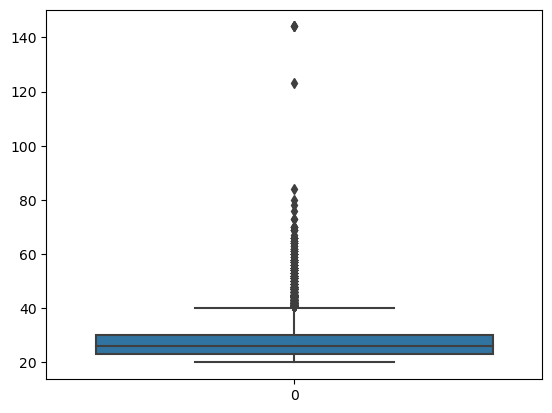

In [13]:
sns.boxplot(df['person_age']) 

In [14]:
df=df[df['person_age'] <ub]
df

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
...,...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,1,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0,0.10,N,26


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28631 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  28631 non-null  int64  
 1   person_income               28631 non-null  int64  
 2   person_home_ownership       28631 non-null  object 
 3   person_emp_length           28631 non-null  float64
 4   loan_intent                 28631 non-null  object 
 5   loan_grade                  28631 non-null  object 
 6   loan_amnt                   28631 non-null  int64  
 7   loan_int_rate               28631 non-null  float64
 8   loan_status                 28631 non-null  object 
 9   loan_percent_income         28631 non-null  float64
 10  cb_person_default_on_file   28631 non-null  object 
 11  cb_person_cred_hist_length  28631 non-null  int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 2.8+ MB


In [16]:
min(df['person_age'])

20

# EDA

- Single Numerical variable (`Continuous variable`):
    - Histogram
    - Distplot (pdf)
    - Boxplot
    - violinplot
    
- Single Categorical variable (`Descrete variable`):
    - pieplot
    - countplot
    - barplot (syntax is different)
    
- Numerical and Numerical variable:
    - Scatterplot
    - regplot
    - pairplot
    - relplot
    - heatmap
    
- categorical and numerical variable:
    - barplot
    - boxplot
    - scatterplot
    - violinplot
    - lineplot
    - swarmplot
    
- categorical and categorical variables:
    - do the crosstab then draw the barplot

# Univariate analysis

# single numerical column

In [17]:
for i in df.select_dtypes(include='number').columns:
    fig = px.histogram(df, x=i, nbins=60)
    fig.show()

C:\Users\adepu bharath kumar\AppData\Local\Temp\ipykernel_10040\1402494050.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




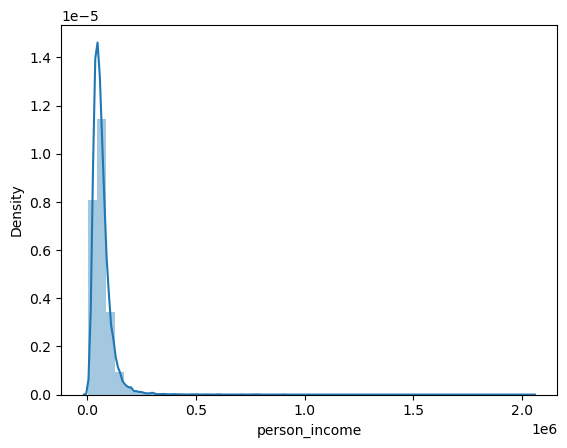

In [23]:
sns.distplot(a=df["person_income"]);

# single categorical column

In [18]:
for i in df.select_dtypes(include='object').columns:
    fig = px.histogram(df, x=i)
    fig.show()

# Bivariate analysis

# numerical and numerical columns

In [19]:
@interact_manual
def groupby(col1 = df.select_dtypes('number').columns,
           col2 = df.select_dtypes('number').columns):
    sns.jointplot(data = df,x = col1,y = col2,hue='loan_status');
    

interactive(children=(Dropdown(description='col1', options=('person_age', 'person_income', 'person_emp_length'…

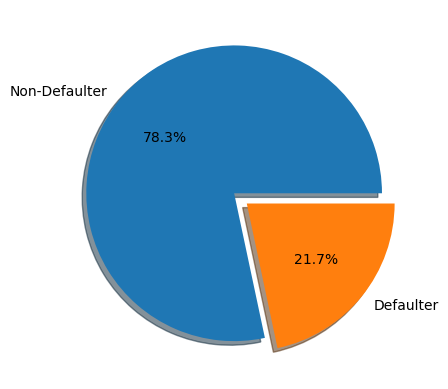

In [22]:
r = df.groupby('loan_status')['loan_status'].count()
plt.pie(r, explode=[0.01, 0.1], labels=['Non-Defaulter', 'Defaulter'], radius=1.0, autopct='%1.1f%%',  shadow=True);

# categorical and numerical variables

In [20]:
@interact_manual
def groupby(col1 = df.select_dtypes('number').columns,
           col2 = df.select_dtypes('object').columns):
    sns.boxplot(data = df,x = col1,y = col2,hue='loan_status');

interactive(children=(Dropdown(description='col1', options=('person_age', 'person_income', 'person_emp_length'…

# categorical and categorical columns

In [21]:
pd.crosstab(df['loan_status'],df['loan_int_rate'],margins=True)

loan_int_rate,5.42,5.79,5.99,6.0,6.03,6.17,6.39,6.54,6.62,6.76,...,21.21,21.27,21.36,21.64,21.74,22.06,22.11,22.48,23.22,All
loan_status,,,,,,,,,,,,,,,,,,,,,
0,520,356,311,9,395,188,57,212,352,163,...,0,0,1,0,1,1,0,0,0,22428
1,21,18,28,3,20,15,2,34,41,7,...,4,3,3,1,4,0,3,1,1,6203
All,541,374,339,12,415,203,59,246,393,170,...,4,3,4,1,5,1,3,1,1,28631


In [28]:
pd.crosstab(df['loan_status'],df['cb_person_default_on_file'],margins=True)

cb_person_default_on_file,N,Y,All
loan_status,,,
0,19252,3176,22428
1,4276,1927,6203
All,23528,5103,28631


In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28631 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  28631 non-null  int64  
 1   person_income               28631 non-null  int64  
 2   person_home_ownership       28631 non-null  object 
 3   person_emp_length           28631 non-null  float64
 4   loan_intent                 28631 non-null  object 
 5   loan_grade                  28631 non-null  object 
 6   loan_amnt                   28631 non-null  int64  
 7   loan_int_rate               28631 non-null  float64
 8   loan_status                 28631 non-null  object 
 9   loan_percent_income         28631 non-null  float64
 10  cb_person_default_on_file   28631 non-null  object 
 11  cb_person_cred_hist_length  28631 non-null  int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 2.8+ MB


# Multivariate analysis

In [29]:
h=df.corr()
h

C:\Users\adepu bharath kumar\AppData\Local\Temp\ipykernel_15832\940027123.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length
person_age,1.000000,0.141854,0.167445,0.056484,0.011013,-0.039082,0.877782
person_income,0.141854,1.000000,0.158932,0.324740,-0.003886,-0.297610,0.122861
person_emp_length,0.167445,0.158932,1.000000,0.111331,-0.056214,-0.054845,0.145021
loan_amnt,0.056484,0.324740,0.111331,1.000000,0.145947,0.577347,0.045737
loan_int_rate,0.011013,-0.003886,-0.056214,0.145947,1.000000,0.123555,0.015650
loan_percent_income,-0.039082,-0.297610,-0.054845,0.577347,0.123555,1.000000,-0.029573
cb_person_cred_hist_length,0.877782,0.122861,0.145021,0.045737,0.015650,-0.029573,1.000000


<Axes: >

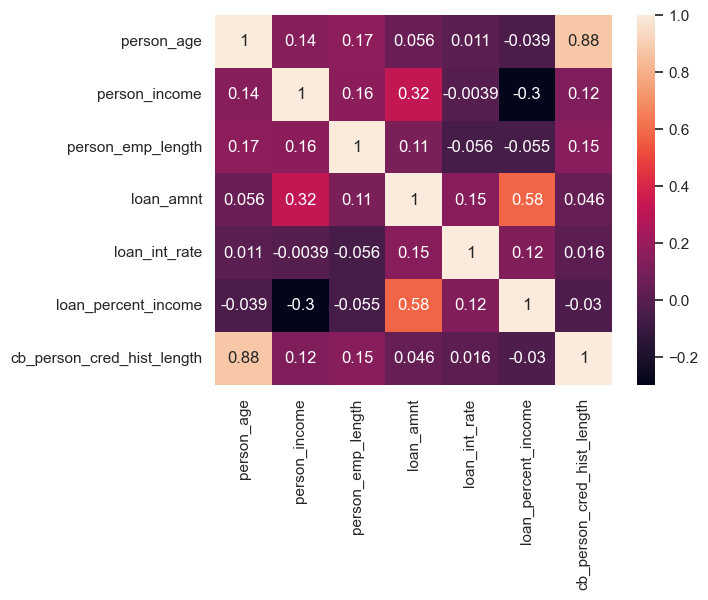

In [30]:
sns.heatmap(h,annot=True,)

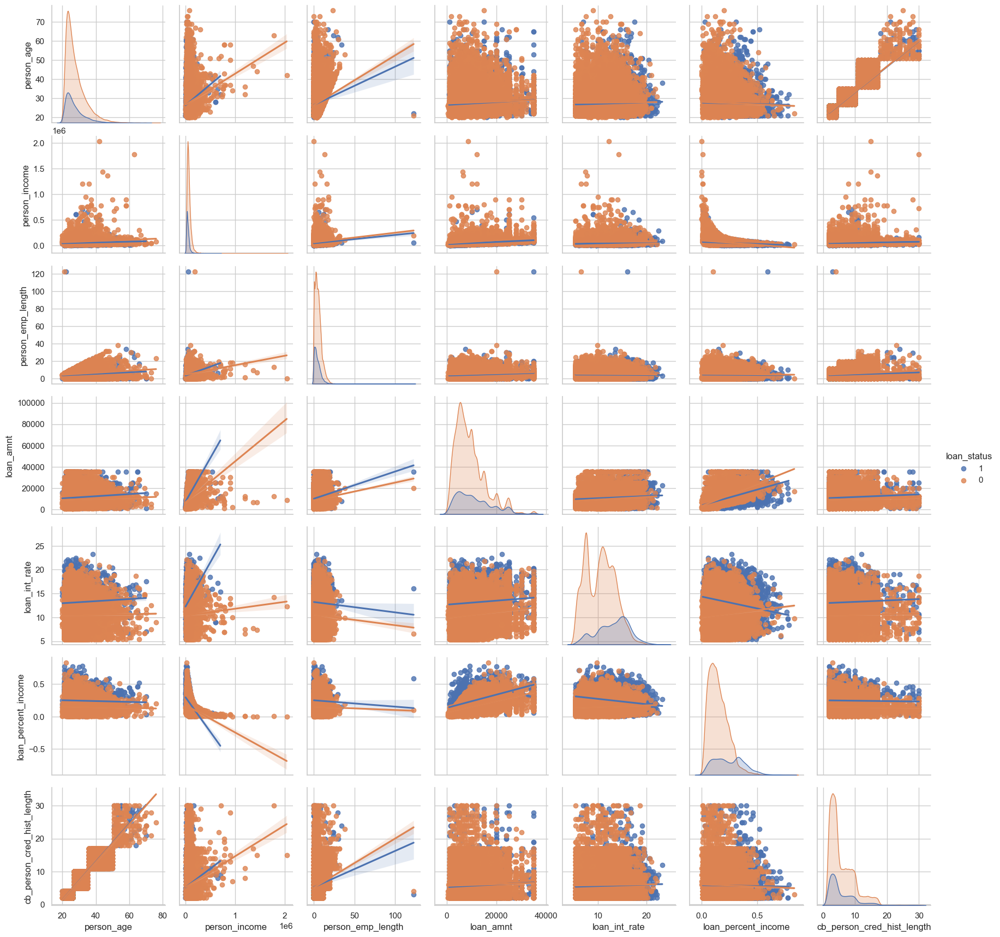

In [31]:
sns.set_style('whitegrid')
sns.pairplot(df,hue='loan_status',kind='reg') #kind :scatter,hist,kde

# EDA insights
- 1 . Rent , mortage and other ownership people are not repaying the debt they have more defaults

- 2 . rent,own,mortage,other have more intrest and most of the people are not paying the interest
- 3 . Most of the percent income is gathering from loan default status
- 4 . most of the intrest rate is allocated to the people who are have loan default status
- 5 . loan defaulters took the more amount rather than non default people
- 6 . non default people has more income than default people
- 7 . non default and default people have approximately same employment length
- 8 . loan default on file is 1927 and not on file 4276 	
- 9 . both have same credit history length
- 10. maximum age of a person took the loan is 76 and minimium age is 20

In [24]:
df_copy=df.copy()
df_copy

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
...,...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,1,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0,0.10,N,26


# Machine learning pipeline
- split the data 
- data transformation
- model building
- model evaluation

# Data transformation for Categorical data
- one hot encoding
- label encoding


## Data transformation for numerical data
- standardization and normalization

# data tranformation using dummies method

In [50]:
df_copy1=df.copy()

In [56]:
#Convert the target variable 'loan status' in a binary numeric variable i.e. default=1 ; Nd = 0
df_copy1['loan_status'] = np.where(df_copy1.loan_status == 'Def',1,0)
df_copy1.head()
df_copy1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28631 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  28631 non-null  int64  
 1   person_income               28631 non-null  int64  
 2   person_home_ownership       28631 non-null  object 
 3   person_emp_length           28631 non-null  float64
 4   loan_intent                 28631 non-null  object 
 5   loan_grade                  28631 non-null  object 
 6   loan_amnt                   28631 non-null  int64  
 7   loan_int_rate               28631 non-null  float64
 8   loan_status                 28631 non-null  int32  
 9   loan_percent_income         28631 non-null  float64
 10  cb_person_default_on_file   28631 non-null  object 
 11  cb_person_cred_hist_length  28631 non-null  int64  
dtypes: float64(3), int32(1), int64(4), object(4)
memory usage: 3.7+ MB


In [55]:
df_copy1_dummies=pd.get_dummies(df_copy1)
df_copy1_dummies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28631 entries, 0 to 32580
Data columns (total 27 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   person_age                      28631 non-null  int64  
 1   person_income                   28631 non-null  int64  
 2   person_emp_length               28631 non-null  float64
 3   loan_amnt                       28631 non-null  int64  
 4   loan_int_rate                   28631 non-null  float64
 5   loan_status                     28631 non-null  int32  
 6   loan_percent_income             28631 non-null  float64
 7   cb_person_cred_hist_length      28631 non-null  int64  
 8   person_home_ownership_MORTGAGE  28631 non-null  uint8  
 9   person_home_ownership_OTHER     28631 non-null  uint8  
 10  person_home_ownership_OWN       28631 non-null  uint8  
 11  person_home_ownership_RENT      28631 non-null  uint8  
 12  loan_intent_DEBTCONSOLIDATION   

## Splitting the data into X and y train and test

In [57]:
X=df_copy1_dummies.drop('loan_status' ,axis=1)
y=df['loan_status']
from sklearn.model_selection import train_test_split as split
X_train, X_test,y_train,y_test=split(X,y,test_size=0.25,random_state=0)
X_train


,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,person_home_ownership_MORTGAGE,person_home_ownership_OTHER,person_home_ownership_OWN,...,loan_intent_VENTURE,loan_grade_A,loan_grade_B,loan_grade_C,loan_grade_D,loan_grade_E,loan_grade_F,loan_grade_G,cb_person_default_on_file_N,cb_person_default_on_file_Y
22716,31,57400,6.0,7600,5.99,0.13,10,1,0,0,...,0,1,0,0,0,0,0,0,1,0
2346,21,30000,3.0,2500,7.14,0.08,4,0,0,0,...,0,1,0,0,0,0,0,0,1,0
7573,22,38000,2.0,6400,20.62,0.17,3,0,0,0,...,0,0,0,0,0,0,1,0,1,0
7456,22,53000,4.0,8000,16.07,0.15,4,1,0,0,...,0,0,0,0,1,0,0,0,0,1
13669,22,95000,0.0,6875,6.54,0.07,2,1,0,0,...,0,1,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14926,25,120000,5.0,10000,6.62,0.08,3,1,0,0,...,0,1,0,0,0,0,0,0,1,0
22331,27,30000,2.0,7000,10.37,0.23,7,0,0,0,...,0,0,1,0,0,0,0,0,1,0
11224,25,72000,7.0,25000,11.89,0.35,2,1,0,0,...,0,0,1,0,0,0,0,0,1,0
12296,25,62900,9.0,8825,15.70,0.12,3,1,0,0,...,0,0,0,0,1,0,0,0,0,1


In [58]:
y_train


22716    0
2346     1
7573     1
7456     0
13669    0
        ..
14926    0
22331    0
11224    0
12296    1
3144     1
Name: loan_status, Length: 21473, dtype: object

# Model building

## K-NN classifier

In [59]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier()
knn.fit(X_train,y_train)


KNeighborsClassifier()

# Evalution metric for k-nn

In [101]:
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
y_pred_knn=knn.predict(X_test)
knn.score(X_test,y_test)

0.8341715563006427

In [102]:
print(classification_report(y_test,y_pred_knn))

              precision    recall  f1-score   support

           0       0.87      0.93      0.90      5631
           1       0.65      0.48      0.55      1527

    accuracy                           0.83      7158
   macro avg       0.76      0.71      0.73      7158
weighted avg       0.82      0.83      0.82      7158



In [103]:
metrics.accuracy_score(y_test,y_pred_knn)

0.8341715563006427

# Decision tree classifier

In [145]:
from sklearn.tree import DecisionTreeClassifier
decision=DecisionTreeClassifier()
decision.fit(X_train,y_train)

DecisionTreeClassifier()

In [146]:
y_pred_dt=decision.predict(X_test)

# Evalution for decision tree classifier

In [147]:
decision.score(X_train,y_train)
print(classification_report(y_test,y_pred_dt))

              precision    recall  f1-score   support

           0       0.94      0.93      0.93      5631
           1       0.75      0.77      0.76      1527

    accuracy                           0.90      7158
   macro avg       0.84      0.85      0.85      7158
weighted avg       0.90      0.90      0.90      7158



In [148]:
metrics.accuracy_score(y_test,y_pred_dt)

0.8959206482257613

# Logistic regression

In [109]:
from sklearn.linear_model import LogisticRegression
logistic=LogisticRegression()
logistic.fit(X_train,y_train)

LogisticRegression()

In [111]:
y_pred_lr=logistic.predict(X_test)

# Evalution for logistic regression

In [113]:
print(classification_report(y_test,y_pred_lr))

              precision    recall  f1-score   support

           0       0.81      0.98      0.89      5631
           1       0.73      0.16      0.27      1527

    accuracy                           0.81      7158
   macro avg       0.77      0.57      0.58      7158
weighted avg       0.80      0.81      0.76      7158



In [114]:
metrics.accuracy_score(y_test,y_pred_lr)

0.8086057557977089

# RandomForestClassifier

In [115]:
from sklearn.ensemble import RandomForestClassifier
randomforest=RandomForestClassifier()
randomforest.fit(X_train,y_train)

RandomForestClassifier()

In [117]:
y_pred_rfc=randomforest.predict(X_test)

# Evalution for random forest classifier

In [118]:
print(classification_report(y_test,y_pred_rfc))

              precision    recall  f1-score   support

           0       0.93      0.99      0.96      5631
           1       0.96      0.71      0.82      1527

    accuracy                           0.93      7158
   macro avg       0.94      0.85      0.89      7158
weighted avg       0.93      0.93      0.93      7158



In [119]:
metrics.accuracy_score(y_test,y_pred_rfc)

0.9322436434758312

# SVC

In [120]:
from sklearn.svm import SVC
svc=SVC()
svc.fit(X_train,y_train)

SVC()

In [122]:
y_pred_svc=svc.predict(X_test)


# Evalution for svc

In [123]:
metrics.accuracy_score(y_test,y_pred_svc)

0.8105616093880972

#  Naive bayes

In [124]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train, y_train)

GaussianNB()

In [128]:
y_pred_gnb=gnb.predict(X_test)

 # Evalution for naive bayes

In [129]:
metrics.accuracy_score(y_test,y_pred_gnb)

0.8200614696842693

# ADABoost

In [130]:
from sklearn.ensemble import AdaBoostClassifier
adab_clf = AdaBoostClassifier()
adab_clf.fit(X_train,y_train)

AdaBoostClassifier()

In [131]:
y_pred_class_adab = adab_clf.predict(X_test)

# Evalution for adaboost


In [133]:


print(metrics.classification_report(y_test, y_pred_class_adab))

              precision    recall  f1-score   support

           0       0.91      0.96      0.93      5631
           1       0.80      0.64      0.71      1527

    accuracy                           0.89      7158
   macro avg       0.85      0.80      0.82      7158
weighted avg       0.89      0.89      0.89      7158



In [134]:
metrics.accuracy_score(y_test,y_pred_class_adab)

0.8899133836267114

# Bagging

In [135]:
from sklearn.ensemble import BaggingClassifier
bg_clf = BaggingClassifier()
bg_clf.fit(X_train,y_train)

BaggingClassifier()

In [136]:
y_pred_class_bg = bg_clf.predict(X_test)

# Evalution for bagging

In [137]:
print(metrics.classification_report(y_test, y_pred_class_bg))

              precision    recall  f1-score   support

           0       0.93      0.99      0.96      5631
           1       0.95      0.71      0.81      1527

    accuracy                           0.93      7158
   macro avg       0.94      0.85      0.89      7158
weighted avg       0.93      0.93      0.93      7158



In [138]:
metrics.accuracy_score(y_test,y_pred_class_bg)

0.9301480860575579

In [149]:
score={'Algorithms':['Logistic Regression','KNN','Desision tree','Random forest','SVC','Naive Bayes','Adaboost','Bagging'],'Scores':[80,83,89,93,80,82,88,93]}

In [150]:
score

{'Algorithms': ['Logistic Regression',
  'KNN',
  'Desision tree',
  'Random forest',
  'SVC',
  'Naive Bayes',
  'Adaboost',
  'Bagging'],
 'Scores': [80, 83, 89, 93, 80, 82, 88, 93]}

In [151]:
scores=pd.DataFrame(score)
scores

,Algorithms,Scores
0,Logistic Regression,80
1,KNN,83
2,Desision tree,89
3,Random forest,93
4,SVC,80
5,Naive Bayes,82
6,Adaboost,88
7,Bagging,93


<Axes: xlabel='Algorithms', ylabel='Scores'>

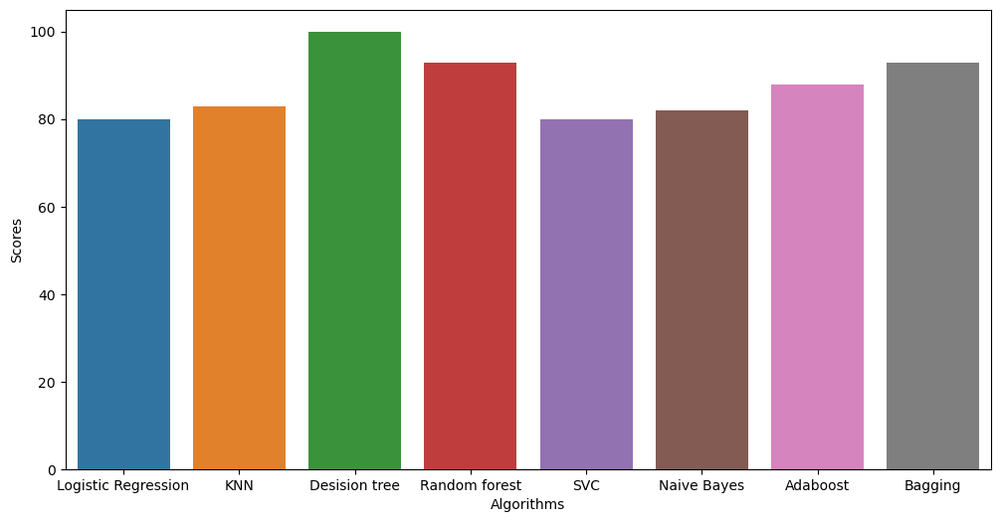

In [142]:
plt.figure(figsize=(12,6))
sns.barplot(data=scores,x=scores['Algorithms'],y=scores['Scores'],)

# Decision Tree algorithm is performing well